# Photometry and Behavioral Data Analysis Framework

- **Import Photometry Data**: Load photometry data from TDMS files, keyed by mouse ID and experimental day, yielding a dictionary of channel names and their corresponding data arrays.
- **Load and Preprocess Behavioral Data**: Organize behavioral data from LVM files into a pandas DataFrame, simplifying subsequent analysis steps.
- **Identify Behavioral Events**: Detect significant events like water valve activations, crucial for correlating behavioral actions with neural signals.
- **Process Data**: Merge photometry and behavioral data, applying baseline corrections to neural signals around reward instances, to examine brain activity in relation to specific behaviors.
- **Across-Mice Analysis**: Conduct and plot analyses across multiple subjects for given conditions or days, enabling comparisons and contrasts of neural activity patterns.

Utilizing essential Python libraries such as numpy, pandas, scipy, seaborn, and matplotlib, this framework ensures data integrity, provides comprehensive error handling, and produces visually appealing analyses.


In [3]:
import os
import numpy as np
import pandas as pd
import scipy.stats
from nptdms import TdmsFile
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def import_photometry_data(directory, mouse_id, day):
    """
    Imports photometry data from TDMS files given a directory, mouse ID, and day.
    Returns a dictionary mapping channel names to data if successful, None otherwise.
    """
    filename = os.path.join(directory, f"{mouse_id}_day{day}.tdms")
    if not os.path.exists(filename):
        print(f"File {filename} does not exist.")
        return None
    try:
        tdms_file = TdmsFile.read(filename)
        return {channel.name: channel[:] for group in tdms_file.groups() for channel in group.channels()}
    except Exception as e:
        print(f"Failed to read {filename}: {e}")
        return None

def load_and_preprocess_behavior_data(directory, mouse_id, day):
    """
    Loads and preprocesses behavioral data from LVM files given a directory, mouse ID, and day.
    Returns a DataFrame with the data if successful, None otherwise.
    """
    filepath = os.path.join(directory, f"{mouse_id}_day{day}.lvm")
    if not os.path.exists(filepath):
        print(f"File {filepath} does not exist.")
        return None

    data = pd.read_csv(filepath, header=None)
    columns = ['time', 'odour_a', 'odour_b', 'odour_c', 'lick_data', 'water_valve']
    data.columns = columns[:len(data.columns)]
    return data.dropna(axis=1, how='all')

def find_signal_rises(signal, threshold=2.5):
    """
    Identifies the indices where the signal rises above a specified threshold.
    Returns an array of indices.
    """
    return np.where(np.diff(signal) > threshold)[0]

def classify_trials(all_odours, sampling_rate=1000):
    ITI_points = int(10 * sampling_rate)  # ITI duration in data points
    #2.5 is because the odour lasts 1 second then 1.5 second later reward comes
    trace_points = int(2.5 * sampling_rate)  # Trace duration in data points

    rewarded_pairs = [('A', 'B'), ('B', 'C'), ('C', 'A')]
    non_rewarded_pairs = [('B', 'A'), ('C', 'B'), ('A', 'C')]

    rewarded_trial_indices = []
    non_rewarded_trial_indices = []

    i = 0
    while i < len(all_odours) - 1:
        current_odour, current_index = all_odours[i]
        # Ensure we have a pair to examine
        if i + 1 < len(all_odours):
            next_odour, next_index = all_odours[i + 1]

            # Check if the next odour occurs within the expected ITI duration; otherwise, it's not a valid pair
            if next_index - current_index <= ITI_points:
                trial_end_index = next_index + trace_points  # Calculate the end index after the trace period
                if (current_odour, next_odour) in rewarded_pairs:
                    rewarded_trial_indices.append((current_odour, next_odour, trial_end_index//2))
                elif (current_odour, next_odour) in non_rewarded_pairs:
                    non_rewarded_trial_indices.append((current_odour, next_odour, trial_end_index//2))
            # If the pair spans beyond the ITI, indicating perhaps an incomplete trial or start of a new one, skip ahead
            else:
                i += 1
                continue
        i += 1  # Move to the next pair for examination

    return rewarded_trial_indices, non_rewarded_trial_indices

# Main function to process photometry and behavior data
def process_photometry_data(directory_photometry, directory_behavior, mouse_id, day, beh_sampling_rate=1000, photo_sampling_rate = 500, reward_signal=True):
    pre_reward_secs, post_reward_secs = 10, 5
    baseline_pre_reward_secs = 1.5

    photometry_data = import_photometry_data(directory_photometry, mouse_id, day)
    behavior_data = load_and_preprocess_behavior_data(directory_behavior, mouse_id, day)
    if photometry_data is None or behavior_data is None:
        print(f"Failed to load data for mouse {mouse_id}.")
        return None

    odour_a_indices = find_signal_rises(behavior_data['odour_a'].values)
    odour_b_indices = find_signal_rises(behavior_data['odour_b'].values)
    odour_c_indices = find_signal_rises(behavior_data['odour_c'].values)

    all_odours = sorted([('A', idx) for idx in odour_a_indices] +
                        [('B', idx) for idx in odour_b_indices] +
                        [('C', idx) for idx in odour_c_indices], key=lambda x: x[1])

    rewarded_trial_indices, non_rewarded_trial_indices = classify_trials(all_odours, beh_sampling_rate)

    pre_reward_points, post_reward_points = int(pre_reward_secs * photo_sampling_rate), int(post_reward_secs * photo_sampling_rate)
    baseline_pre_reward_points = int(baseline_pre_reward_secs * photo_sampling_rate)

    ach_signals = {'PFC': [], 'HPC': []}

    for trial in (rewarded_trial_indices if reward_signal else non_rewarded_trial_indices):
        _, _, trial_end_index = trial
        for area, channel_name in [('PFC', 'Voltage_0 (Filtered)'), ('HPC', 'Voltage_1 (Filtered)')]:
            if channel_name in photometry_data:
                # Corrected calculation for start and end using trial_end_index instead of dividing a tuple
                start, end = max(trial_end_index - pre_reward_points, 0), trial_end_index + post_reward_points
                baseline_end = start + baseline_pre_reward_points
                segment = photometry_data[channel_name][start:end]
                if len(segment) == pre_reward_points + post_reward_points:
                    baseline_mean = np.mean(photometry_data[channel_name][start:baseline_end])
                    ach_signals[area].append(segment - baseline_mean)

    return ach_signals

# Core Plotting Utilities

In [4]:
"""
These functions provide the fundamental plotting capabilities used to visualize data for individual experiments, areas, or conditions. They are designed to be reusable and adaptable across various analysis routines.
"""

def plot_area_signals(area, signal_list, time_axis, colors, day_of_interest, added_legends):
    """
    Plots the signals for a specific brain area, marking key events with vertical lines.
    Ensures no duplicate legend entries for overlaid plots.

    Parameters:
    - area: Brain area to plot.
    - signal_list: Signals to plot.
    - time_axis: Time axis for the plot.
    - colors: Color mapping for each area.
    - day_of_interest: Day for the plot title.
    - added_legends: Set to track added legend entries to avoid duplicates.
    """
    if not signal_list:
        return

    signals_stack = np.vstack(signal_list)
    mean_signal = signals_stack.mean(axis=0)
    sem_signal = scipy.stats.sem(signals_stack, axis=0)
    color = colors.get(area, 'black')

    label = f'{area} Mean Signal'
    if label not in added_legends:
        plt.plot(time_axis, mean_signal, label=label, color=color, linewidth=2)
        added_legends.add(label)
    else:
        plt.plot(time_axis, mean_signal, color=color, linewidth=2)

    plt.fill_between(time_axis, mean_signal - sem_signal, mean_signal + sem_signal, alpha=0.2, color=color)

    events = [(0, 'red', 'Reward Onset'), (-2.5, 'purple', 'Second Odour Onset'), (-8.5, 'magenta', 'First Odour Onset')]
    for x, event_color, label in events:
        if label not in added_legends:
            plt.axvline(x=x, color=event_color, linestyle='--', linewidth=2, label=label)
            added_legends.add(label)
        else:
            plt.axvline(x=x, color=event_color, linestyle='--', linewidth=2)


def plot_signals(signals, pre_reward_secs, post_reward_secs, mouse_ids, overlay, day_of_interest):
    """
    Plots signals for each brain area, with options to overlay signals and specify the day of interest.

    Parameters:
    - signals: Signals to plot, categorized by brain area.
    - pre_reward_secs: Seconds before the reward event to include.
    - post_reward_secs: Seconds after the reward event to include.
    - mouse_ids: Identifiers for the mice included in the plot.
    - overlay: Whether to overlay plots for different brain areas.
    - day_of_interest: The specific day of interest for plotting.
    """
    time_axis = np.linspace(-pre_reward_secs, post_reward_secs, num=(pre_reward_secs + post_reward_secs) * 500)
    colors = {'PFC': 'blue', 'HPC': 'green'}
    added_legends = set()

    def decide_title(area=None):
        base_title = f"Mean ACh Signal around Rewards for {'Multiple Mice' if len(mouse_ids) > 1 else f'Mouse {mouse_ids[0]}'} on Day {day_of_interest}"
        return base_title if overlay or not area else f"{base_title} in {area}"

    plt.figure(figsize=(10, 6))
    for area, signal_list in signals.items():
        if signal_list:
            plot_area_signals(area, signal_list, time_axis, colors, day_of_interest, added_legends)

    plt.title(decide_title(), fontsize=14, fontweight='bold')
    plt.xlabel('Time (s)', fontweight='bold')
    plt.ylabel('Signal Amplitude', fontweight='bold')
    plt.legend()
    plt.show()

# Main Analysis and Overview Plotting Driver functions 

In [5]:
"""
These functions perform comprehensive analysis across multiple datasets or time points, and generate high-level summary plots to visualize the results.
"""

def across_mice_analysis(mouse_ids, day, overlay=True, reward_signal = True):
    """
    Perform analysis across multiple mice for a given day, with an option to overlay the plots.
    
    Parameters:
    - mouse_ids (list): List of mouse identifiers.
    - day (int): Day of interest.
    - overlay (bool): Whether to overlay plots for different brain areas.
    """
    all_signals = {'PFC': [], 'HPC': []}
    pre_reward_secs, post_reward_secs = 10, 5

    for mouse_id in mouse_ids:
        #when not hard drive
        signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal = reward_signal)
        #for hard drive
        # signals = process_photometry_data('/Volumes/Lab_drive/Maxwell_data/Photometry', '/Volumes/Lab_drive/Maxwell_data/Behaviour', mouse_id, day, reward_signal = reward_signal)

        if signals:
            for area in all_signals:
                all_signals[area].extend(signals.get(area, []))

    plot_signals(all_signals, pre_reward_secs, post_reward_secs, mouse_ids, overlay, day)


def plot_signals_across_days(mouse_ids, days_of_interest, area_of_interest):
    """
    Plot average signal traces for both rewarded and non-rewarded signals in a specified brain area across multiple days,
    with vertical lines indicating specific events. Rewarded signals and non-rewarded signals are plotted with different colors
    or line styles for distinction.
    
    Parameters:
    - mouse_ids (list): List of mouse identifiers.
    - days_of_interest (list): Days to include in the plot.
    - area_of_interest (str): Specific brain area to plot (e.g., 'HPC').
    """
    plt.figure(figsize=(15, 8))
    time_axis = np.linspace(-10, 5, num=(10 + 5) * 500)  # Assuming pre_reward_secs=10, post_reward_secs=5, sampling_rate=1000

    # Generate colormaps for rewarded and non-rewarded signals
    cmap_rewarded = cm.get_cmap('Greens', len(days_of_interest))
    cmap_non_rewarded = cm.get_cmap('Reds', len(days_of_interest))

    for idx, day in enumerate(days_of_interest):
        for reward_signal, cmap, label_prefix in zip([True, False], [cmap_rewarded, cmap_non_rewarded], ['Rewarded', 'Non-Rewarded']):
            day_signals = []  # Store signals for this day
            for mouse_id in mouse_ids:
                signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal=reward_signal)
                if signals and area_of_interest in signals:
                    day_signals.extend(signals[area_of_interest])

            if day_signals:
                avg_signal = np.mean(np.vstack(day_signals), axis=0)
                color = cmap(idx)  # Use the colormap index to get a unique color for each day
                plt.plot(time_axis, avg_signal, label=f"{label_prefix} Day {day}", alpha=0.7, color=color)

    # Adding vertical lines for specific events
    events = [
        (0, 'green', 'Reward Onset'),
        (-2.5, 'purple', 'Second Odour Onset'),
        (-8.5, 'magenta', 'First Odour Onset'),
    ]
    for x, color, label in events:
        plt.axvline(x=x, color=color, linestyle='--', linewidth=2, label=label)

    title = f"Mean ACh Signals for {area_of_interest} Across Days for All Mice"
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Time (s)', fontweight='bold')
    plt.ylabel('Signal Amplitude', fontweight='bold')
    plt.legend()
    plt.show()


def plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest, reward_signal=True):
    """
    Plot average signal traces for a specified brain area across multiple days,
    with vertical lines indicating specific events, using a color gradient to indicate time progression.
    
    Parameters:
    - mouse_ids (list): List of mouse identifiers.
    - days_of_interest (list): Days to include in the plot.
    - area_of_interest (str): Specific brain area to plot (e.g., 'HPC').
    - reward_signal (bool): Indicates whether the signals are around rewards (True) or non-rewards (False).
    """
    plt.figure(figsize=(12, 8))
    time_axis = np.linspace(-10, 5, num=(10 + 5) * 500)  # Assuming pre_reward_secs=10, post_reward_secs=5, sampling_rate=1000

    # Generate a colormap and select colors from it
    cmap = cm.get_cmap('viridis', len(days_of_interest))

    for idx, day in enumerate(days_of_interest):
        day_signals = []  # Store signals for this day
        for mouse_id in mouse_ids:
            signals = process_photometry_data('/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry', '/Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour', mouse_id, day, reward_signal=reward_signal)
            if signals and area_of_interest in signals:
                day_signals.extend(signals[area_of_interest])

        if day_signals:
            avg_signal = np.mean(np.vstack(day_signals), axis=0)
            color = cmap(idx)  # Use the colormap index to get a unique color for each day
            plt.plot(time_axis, avg_signal, label=f"Day {day}", alpha=0.8, color=color)

    # Adding vertical lines for specific events
    events = [
        (0, 'red', 'Reward Onset'),
        (-2.5, 'purple', 'Second Odour Onset'),
        (-8.5, 'magenta', 'First Odour Onset'),
    ]
    for x, color, label in events:
        plt.axvline(x=x, color=color, linestyle='--', linewidth=2, label=label)

    # Determine the title based on reward_signal and other parameters
    signal_type_text = "Reward" if reward_signal else "Non-Reward"
    if len(mouse_ids) == 1:
        title = f"Mean ACh Signals for {area_of_interest} Around {signal_type_text} for Mouse {mouse_ids[0]}"
    else:
        title = f"Mean ACh Signals for {area_of_interest} Around {signal_type_text} for All Mice"

    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Time (s)', fontweight='bold')
    plt.ylabel('Signal Amplitude', fontweight='bold')
    plt.legend()
    plt.show()



# Dont delete 

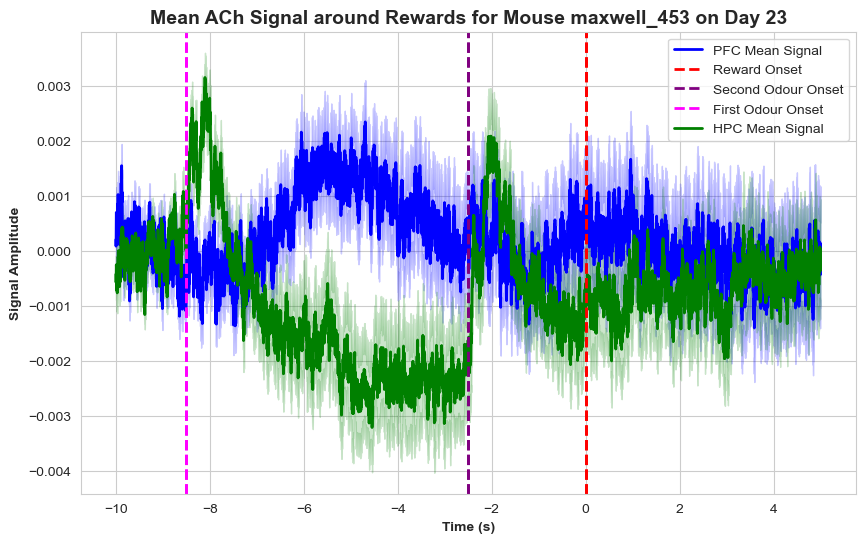

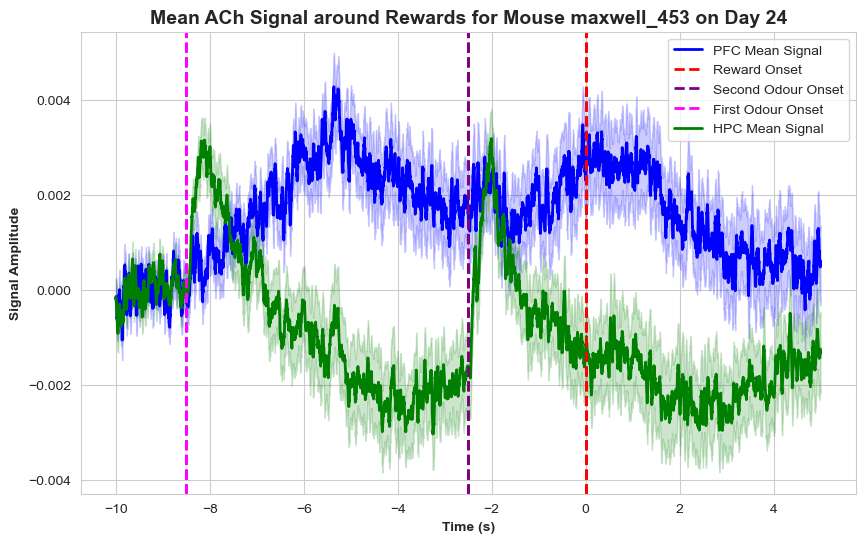

In [7]:
#THIS IS AFTER THE finding signal code (debugged with Andrew) 08/04/2024
mouse_ids = ['maxwell_453']
overlay = True
days_of_interest = [23,24]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay, reward_signal=False)

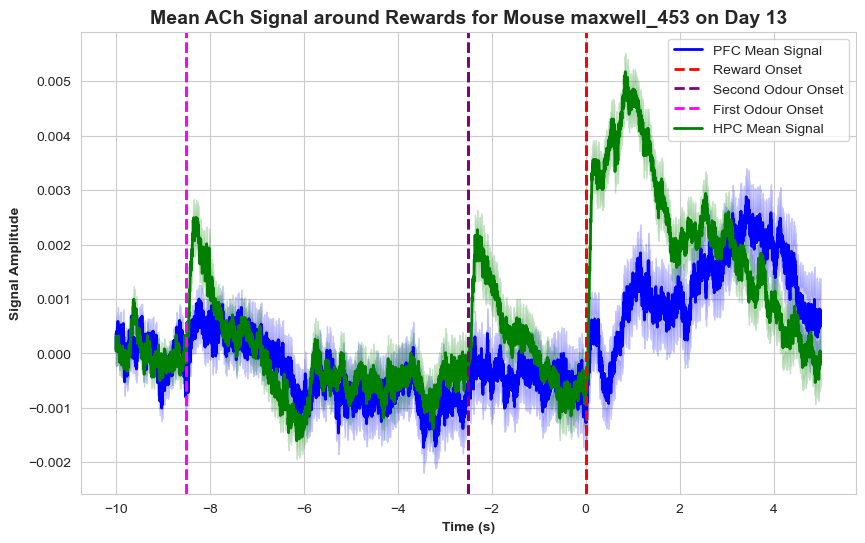

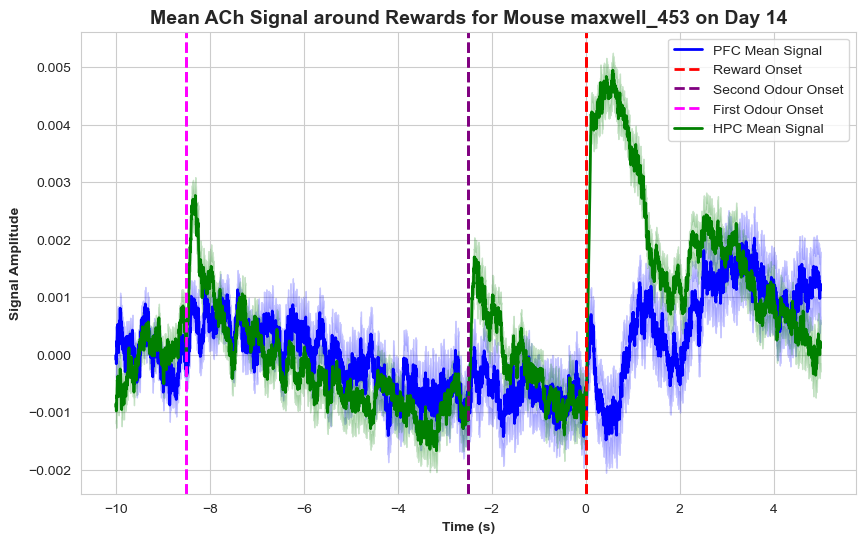

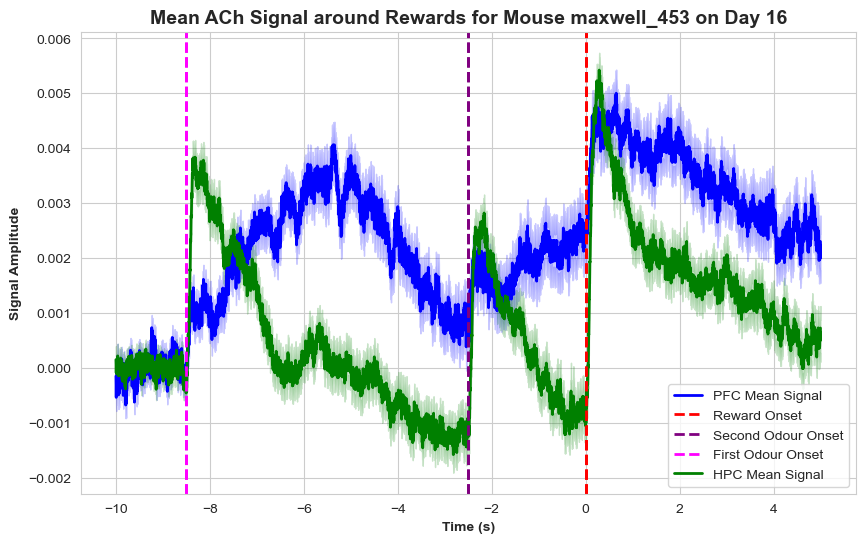

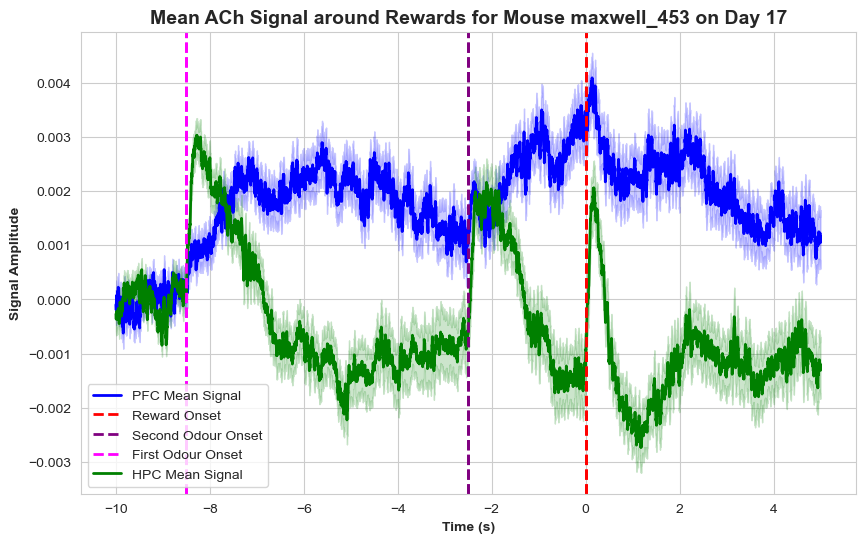

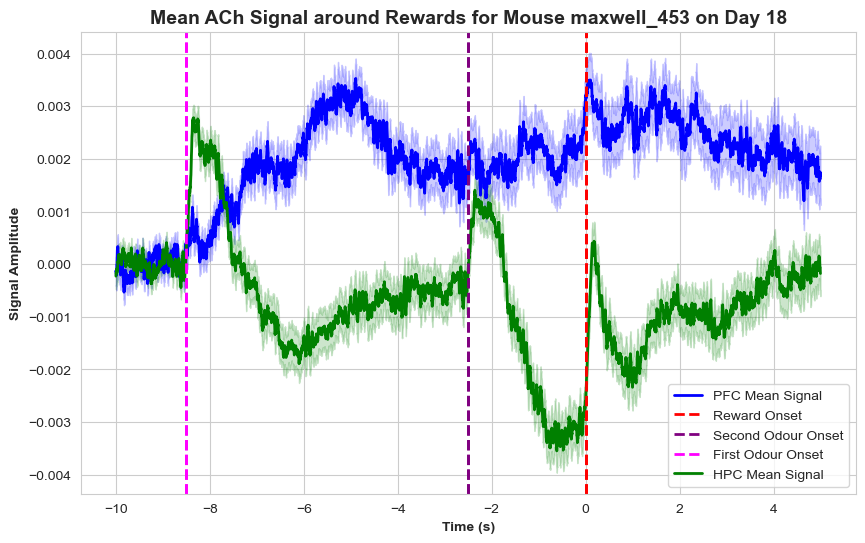

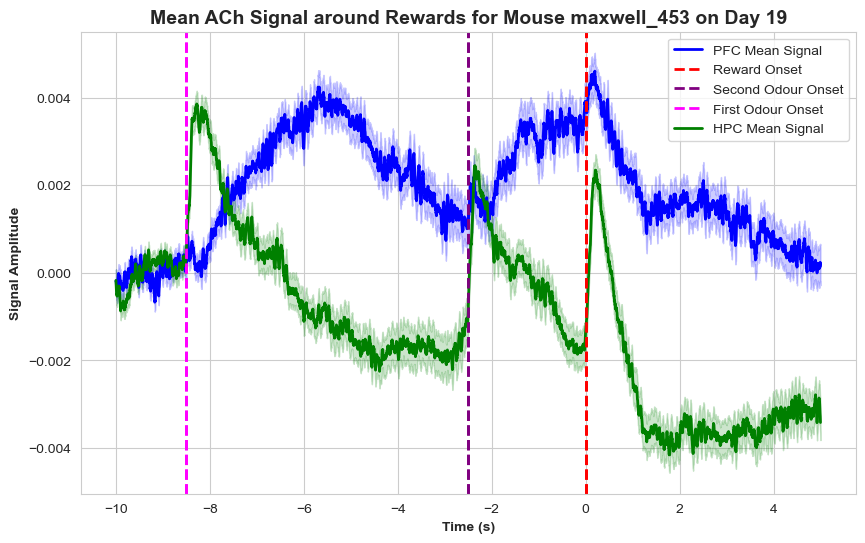

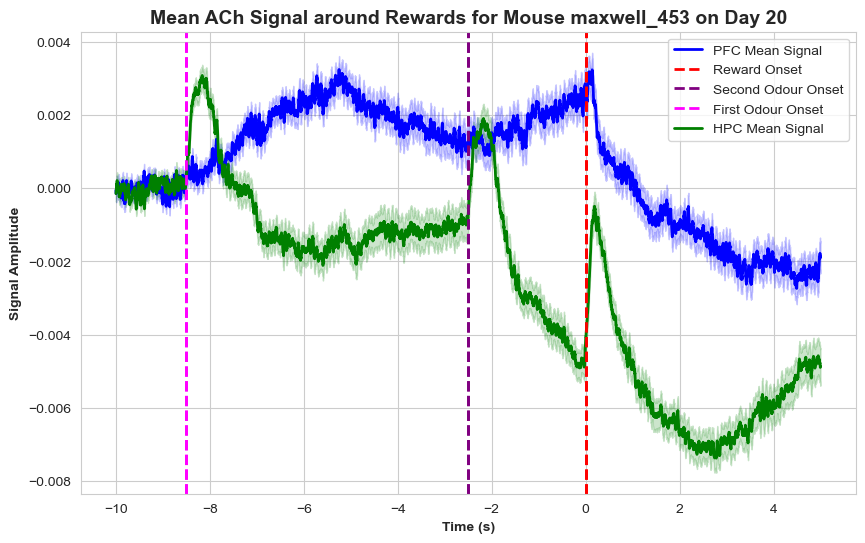

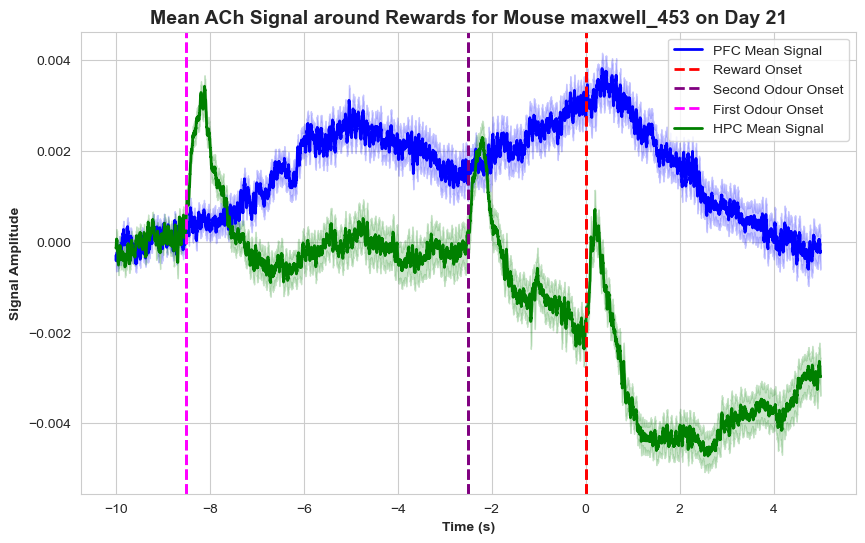

In [36]:
mouse_ids = ['maxwell_453']
overlay = True
days_of_interest = [13,14,16,17,18,19,20,21]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

File /Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry/maxwell_453_day22.tdms does not exist.
File /Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour/maxwell_453_day22.lvm does not exist.
Failed to load data for mouse maxwell_453.


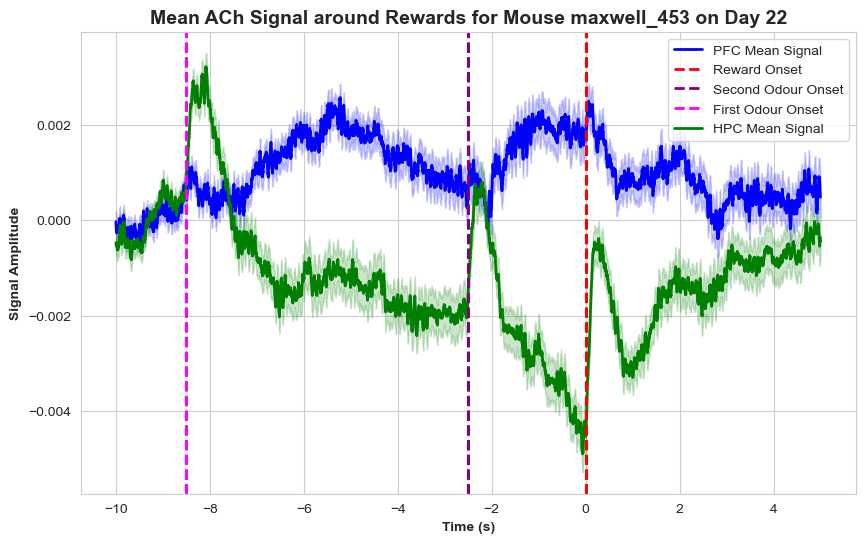

In [4]:
mouse_ids = ['maxwell_453']
overlay = True
days_of_interest = [22]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

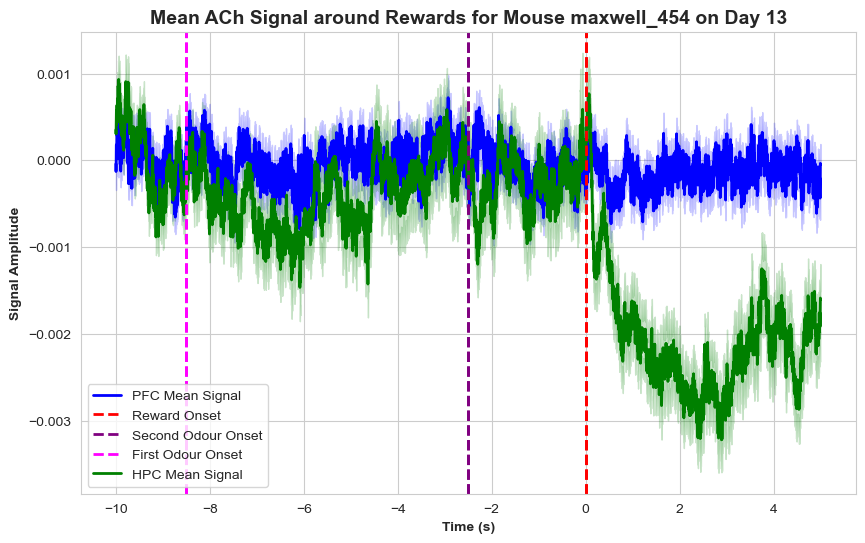

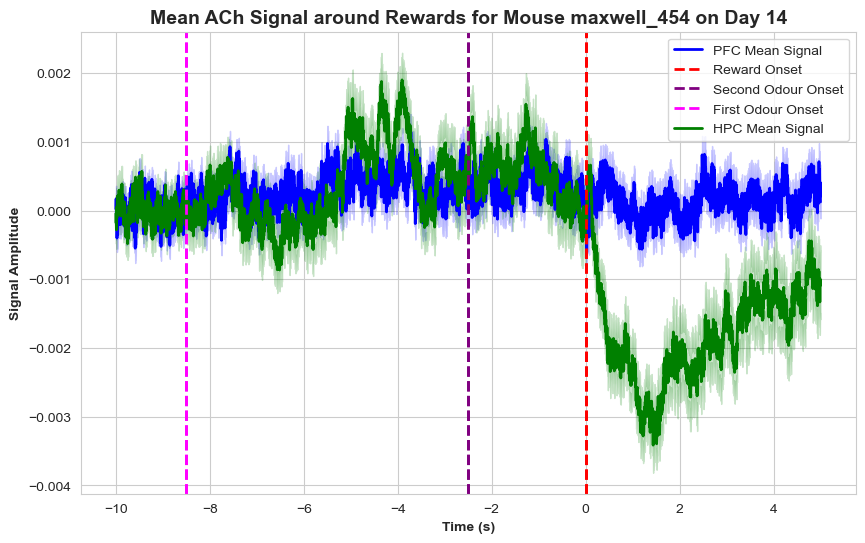

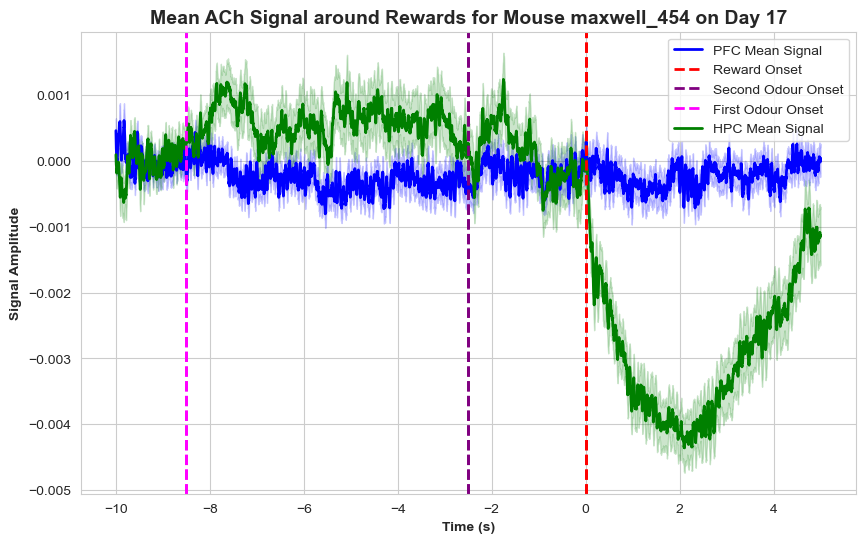

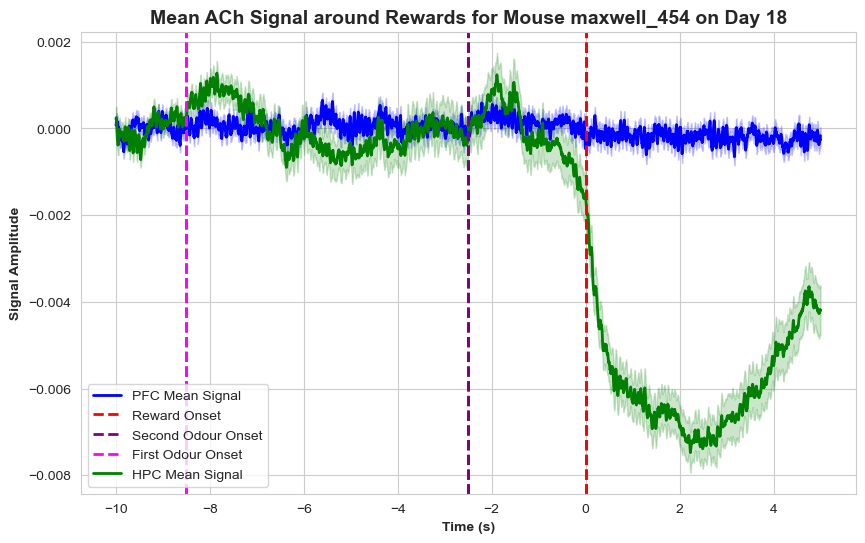

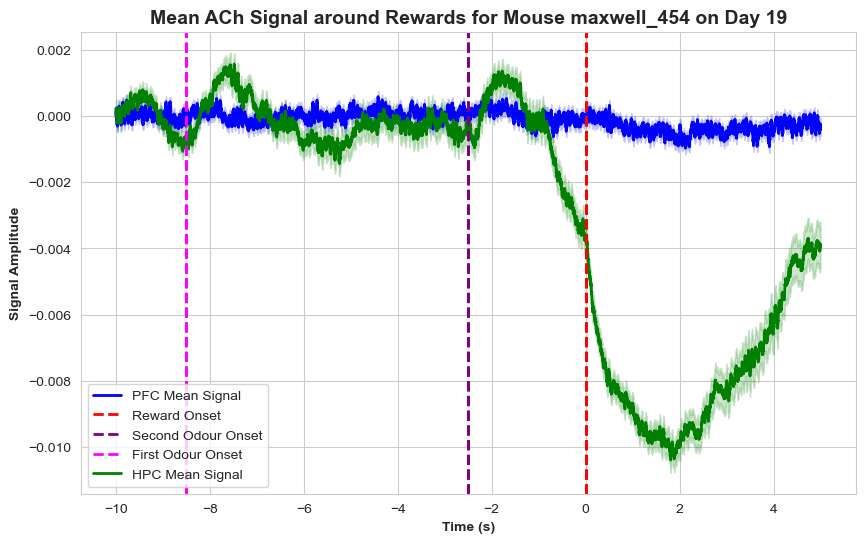

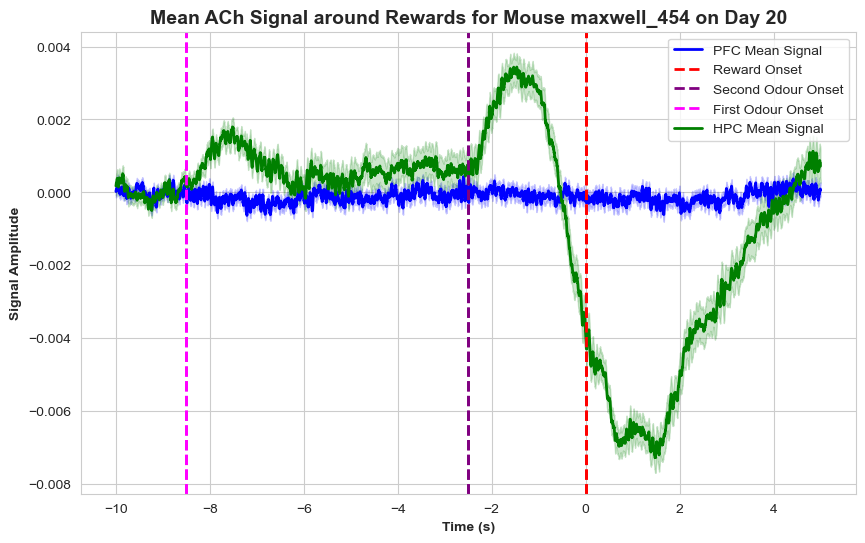

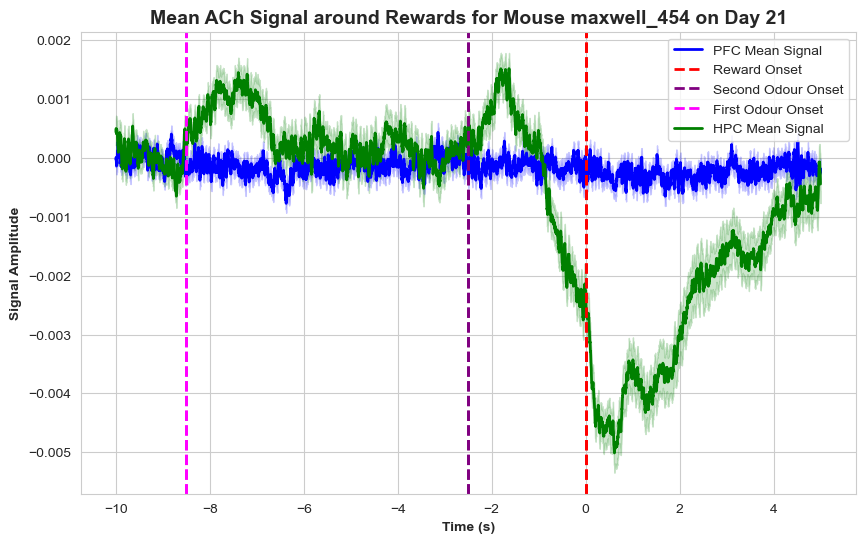

In [37]:
mouse_ids = ['maxwell_454']
overlay = True
days_of_interest = [13,14,17,18,19,20,21]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

File /Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Photometry/maxwell_454_day22.tdms does not exist.
File /Users/chenx/Desktop/MacAskill Lab/Data/My_Rig_Data/Behaviour/maxwell_454_day22.lvm does not exist.
Failed to load data for mouse maxwell_454.


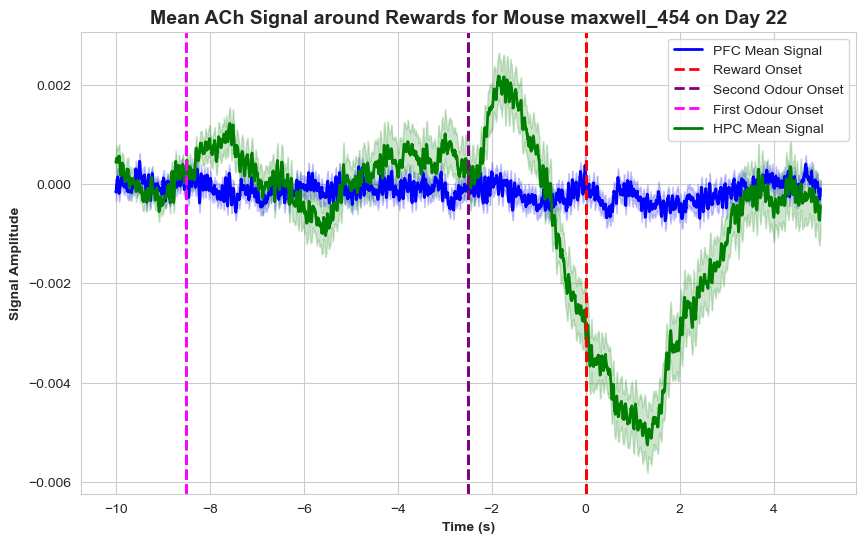

In [5]:
mouse_ids = ['maxwell_454']
overlay = True
days_of_interest = [22]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

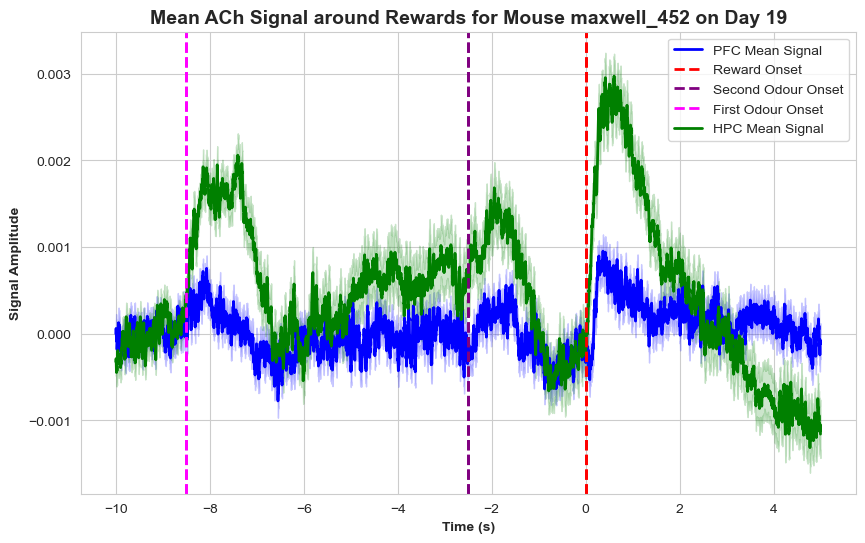

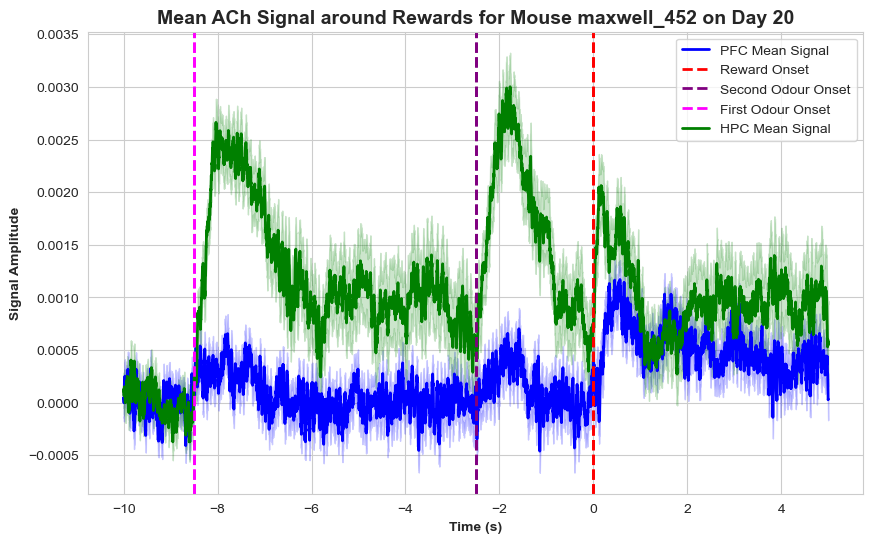

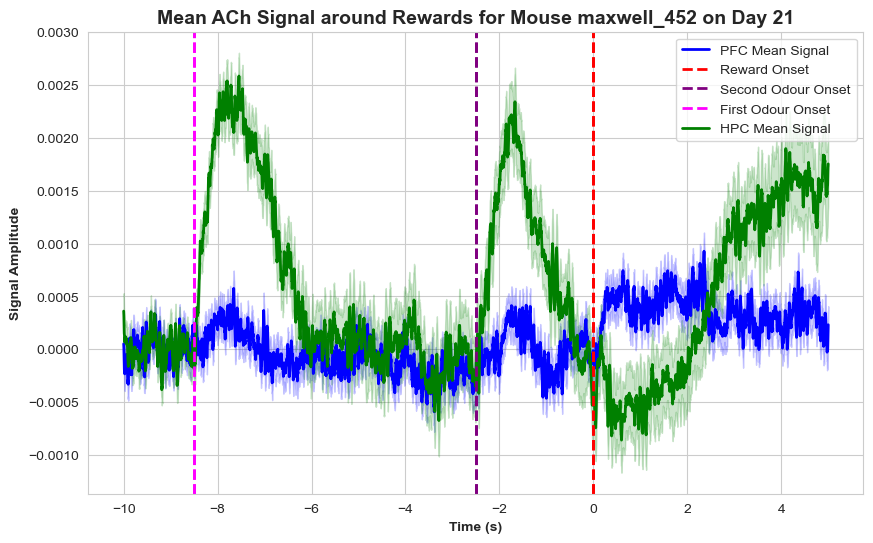

In [38]:
mouse_ids = ['maxwell_452']
overlay = True
days_of_interest = [19,20,21]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

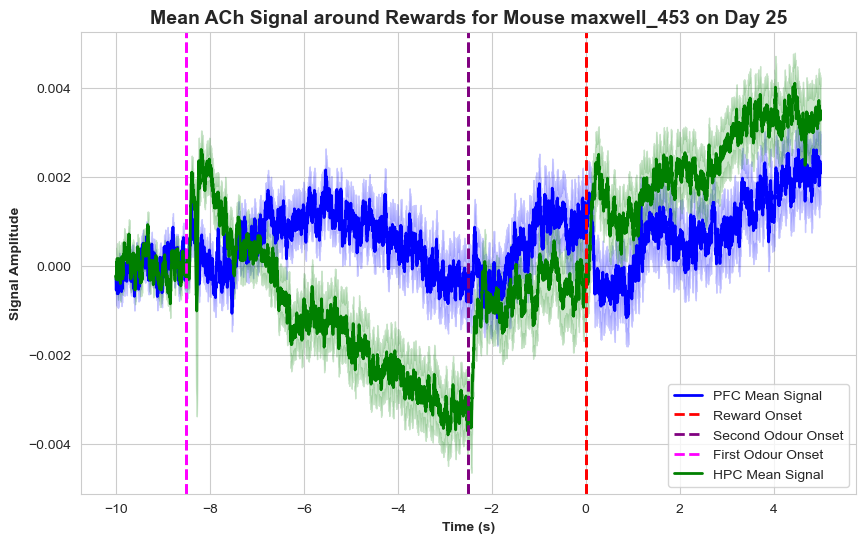

In [10]:
mouse_ids = ['maxwell_453']
overlay = True
days_of_interest = [25]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

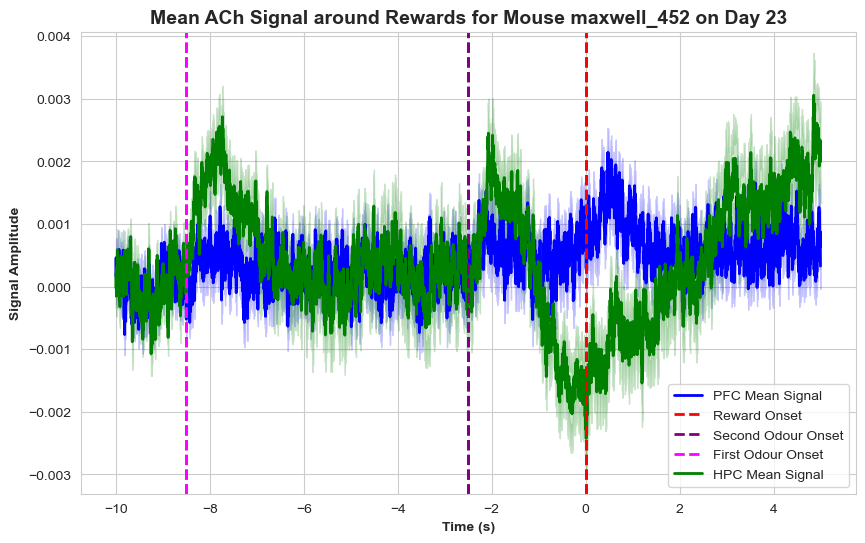

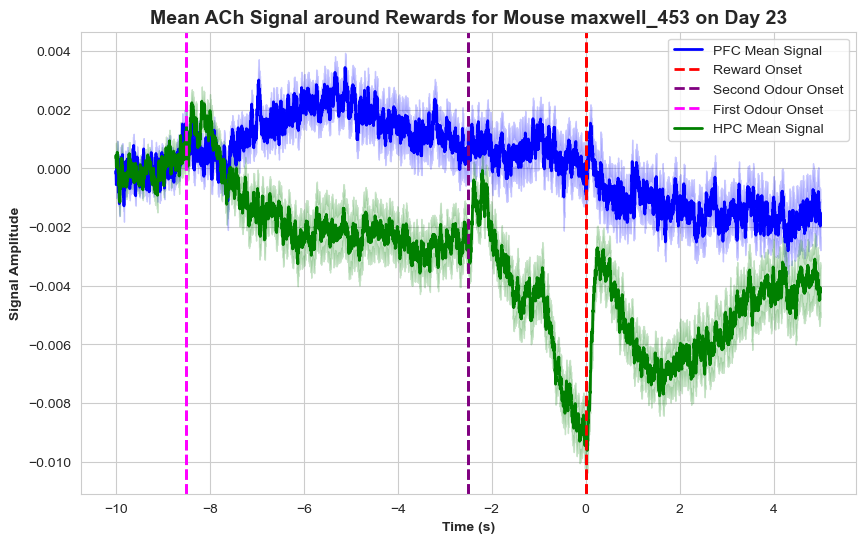

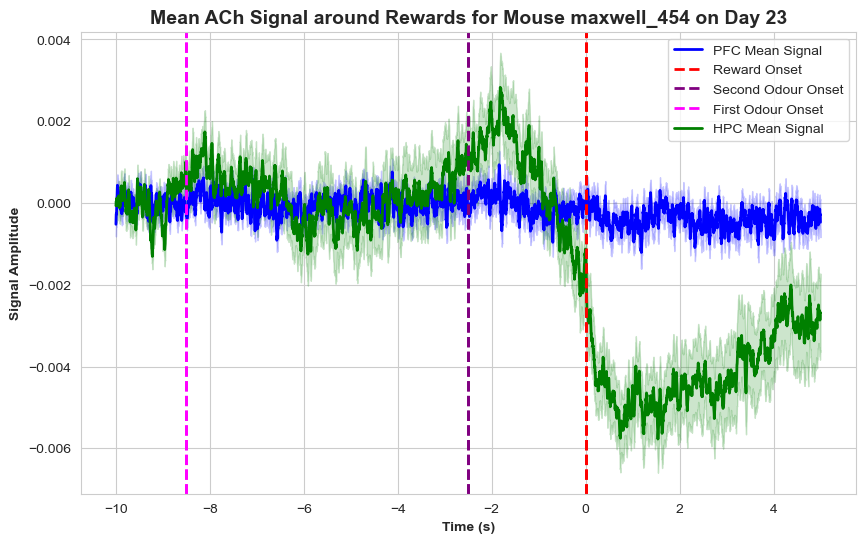

In [8]:
mouse_ids = ['maxwell_452']
overlay = True
days_of_interest = [23]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)
    
mouse_ids = ['maxwell_453']

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

mouse_ids = ['maxwell_454']

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

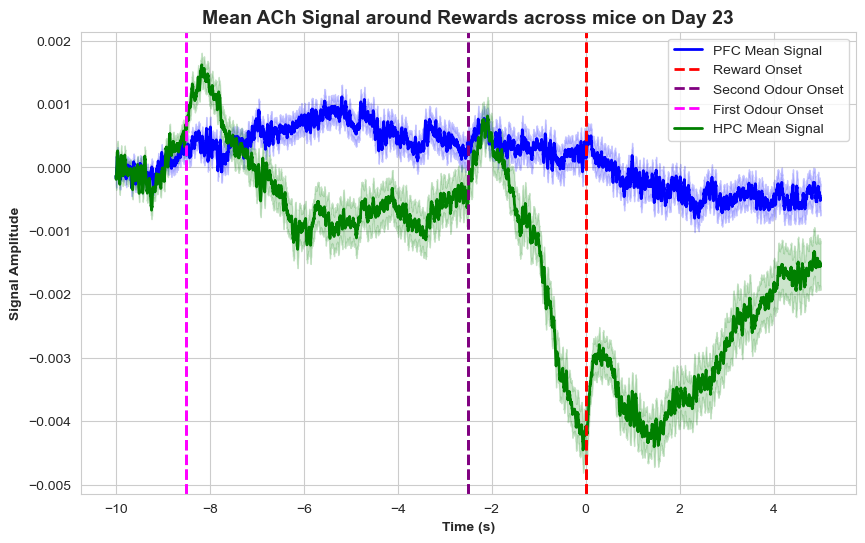

In [12]:
mouse_ids = ['maxwell_452','maxwell_453','maxwell_454']
days_of_interest = [23]
overlay = True

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

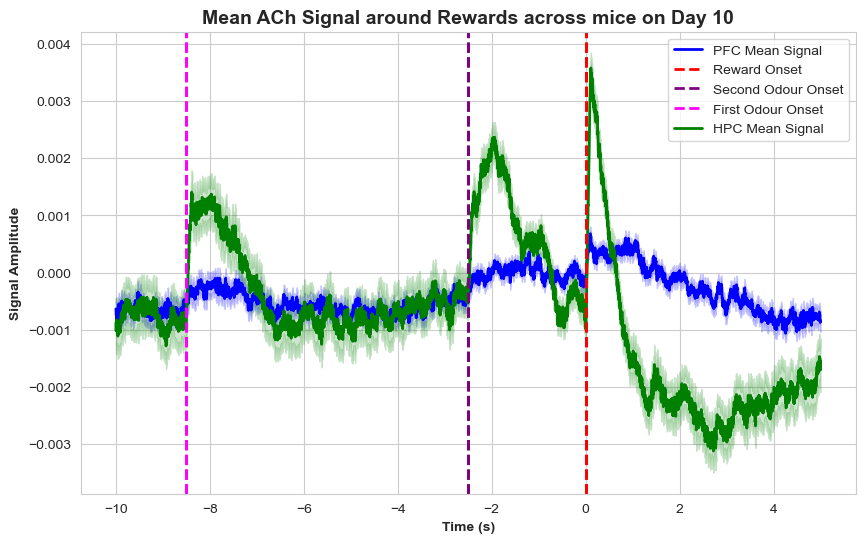

In [24]:
mouse_ids = ['maxwell_452','maxwell_453','maxwell_454']
days_of_interest = [10]
overlay = True

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_32467/1060721912.py:232: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


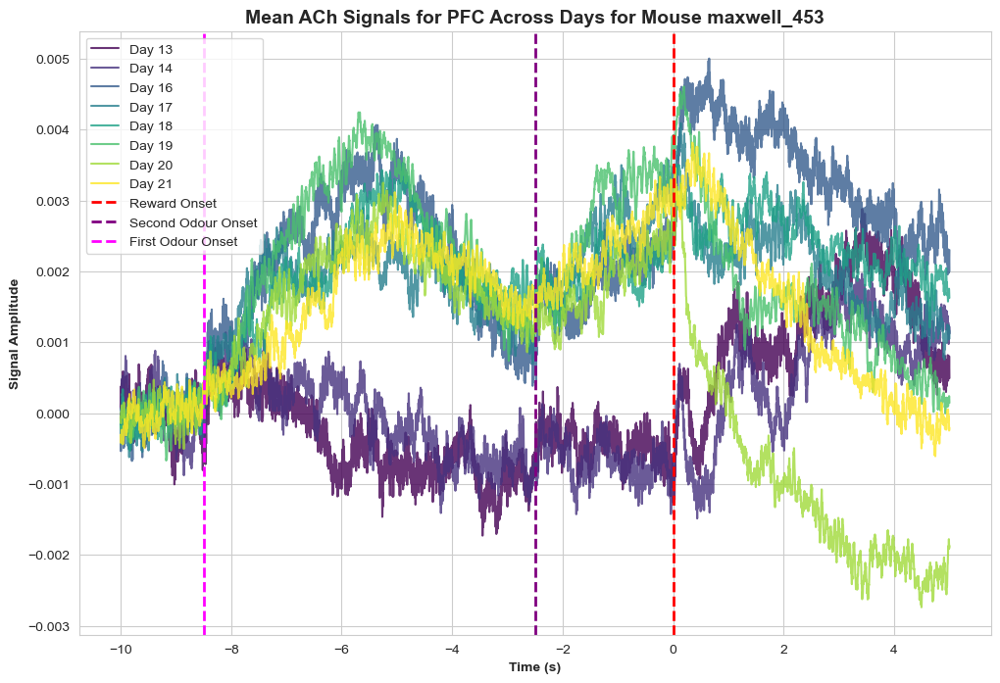

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_32467/1060721912.py:232: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


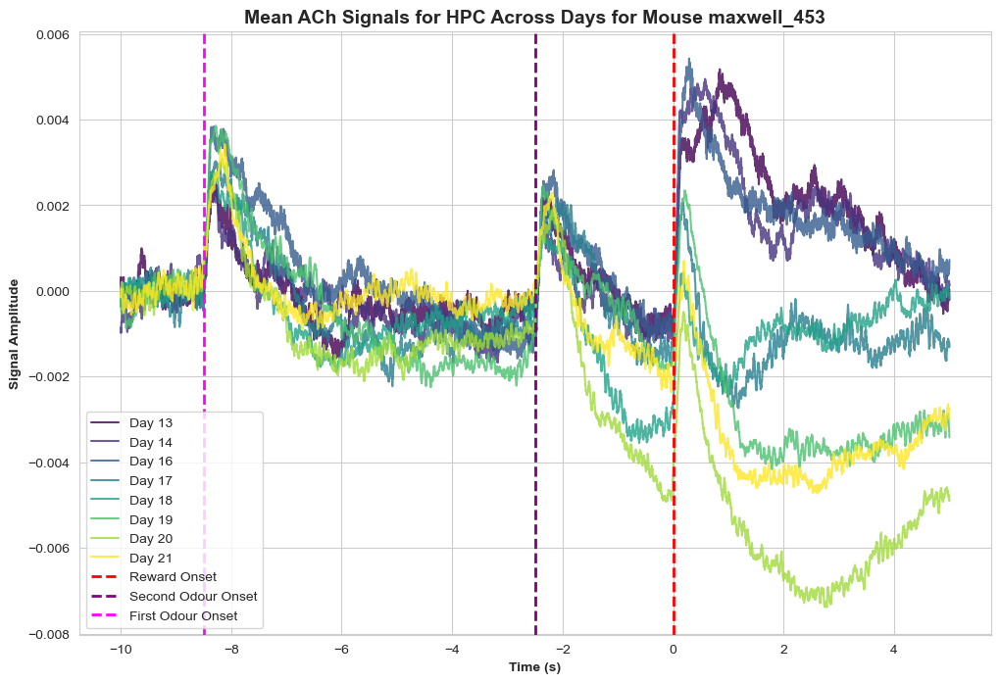

In [28]:
mouse_ids = ['maxwell_453']  # Single mouse
days_of_interest = [13,14,16,17,18,19,20,21]
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

mouse_ids = ['maxwell_453']  # Single mouse
days_of_interest = [13,14,16,17,18,19,20,21]
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_32467/4247589085.py:234: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


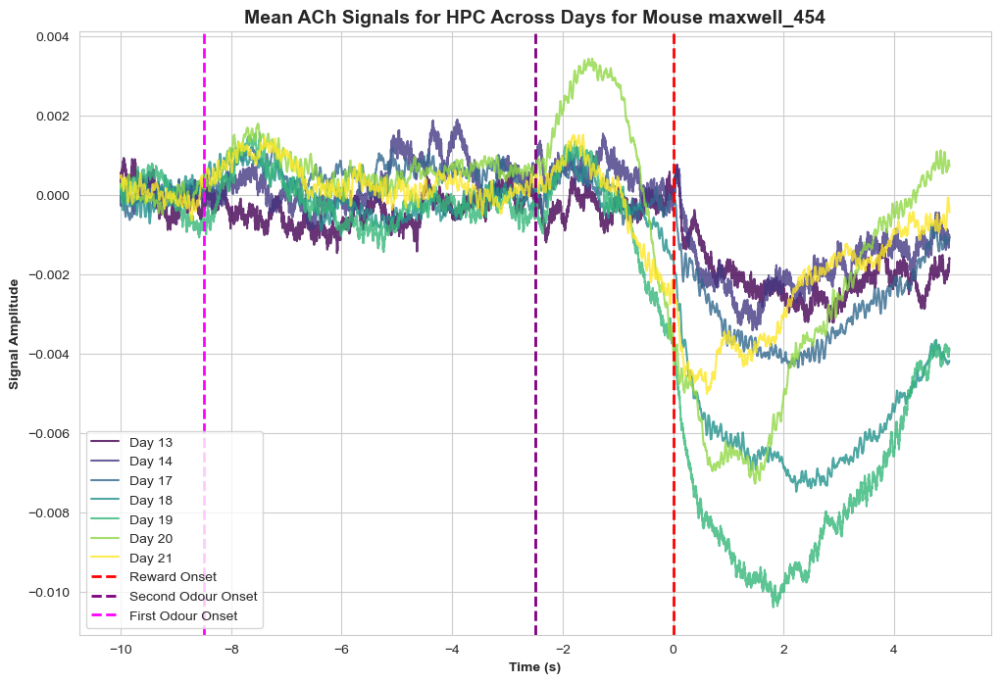

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_32467/4247589085.py:234: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


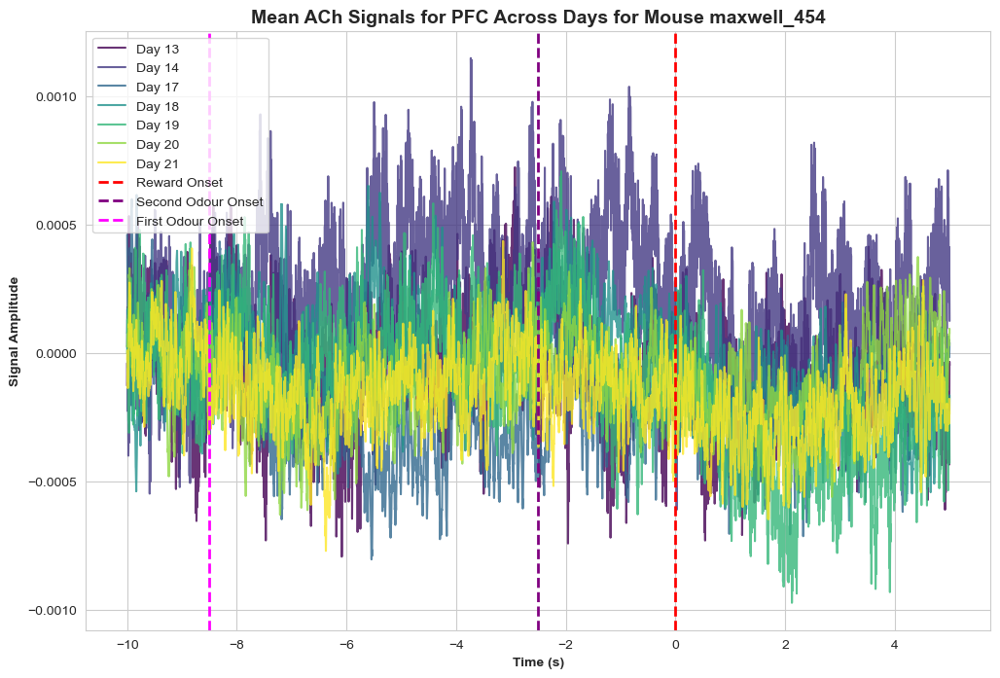

In [40]:
mouse_ids = ['maxwell_454']  # Single mouse
days_of_interest = [13,14,17,18,19,20,21]
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

mouse_ids = ['maxwell_454']  # Single mouse
days_of_interest = [13,14,17,18,19,20,21]
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_32467/4247589085.py:234: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


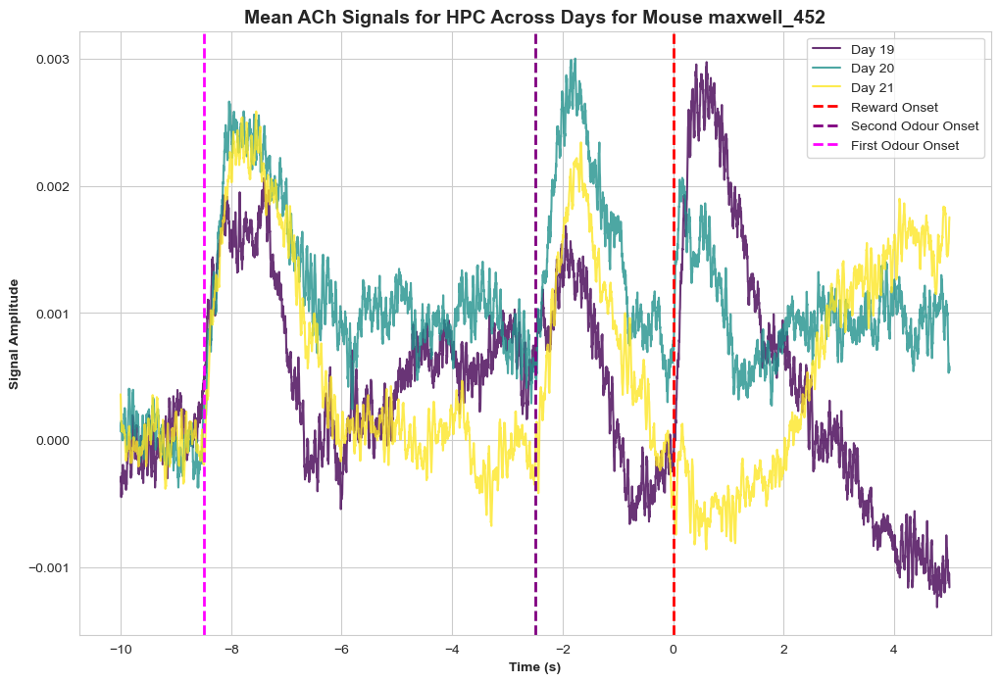

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_32467/4247589085.py:234: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


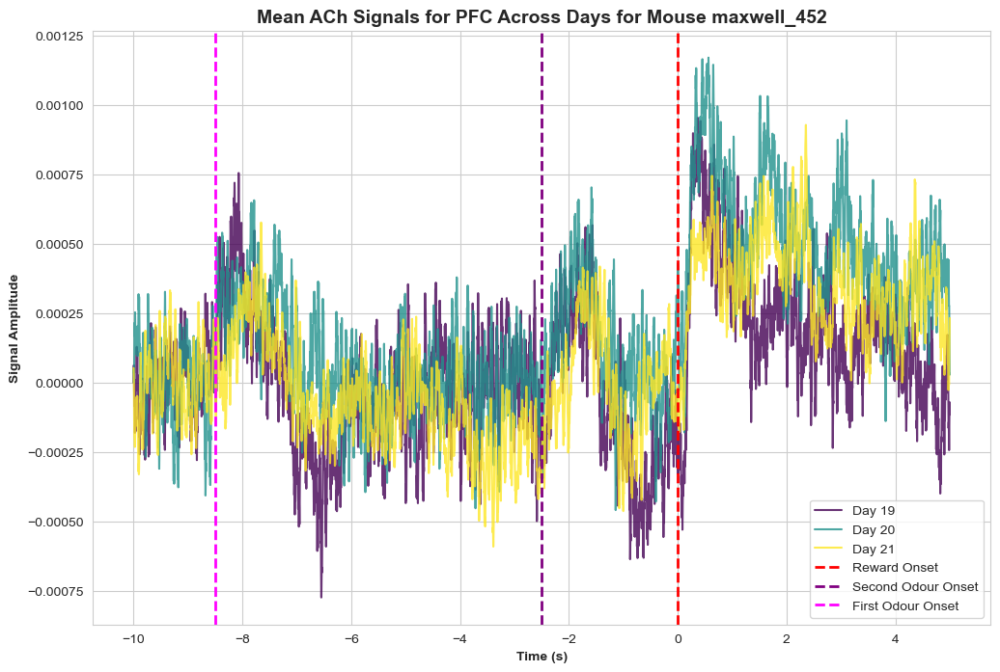

In [41]:
mouse_ids = ['maxwell_452']  # Single mouse
days_of_interest = [19,20,21]
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

mouse_ids = ['maxwell_452']  # Single mouse
days_of_interest = [19,20,21]
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

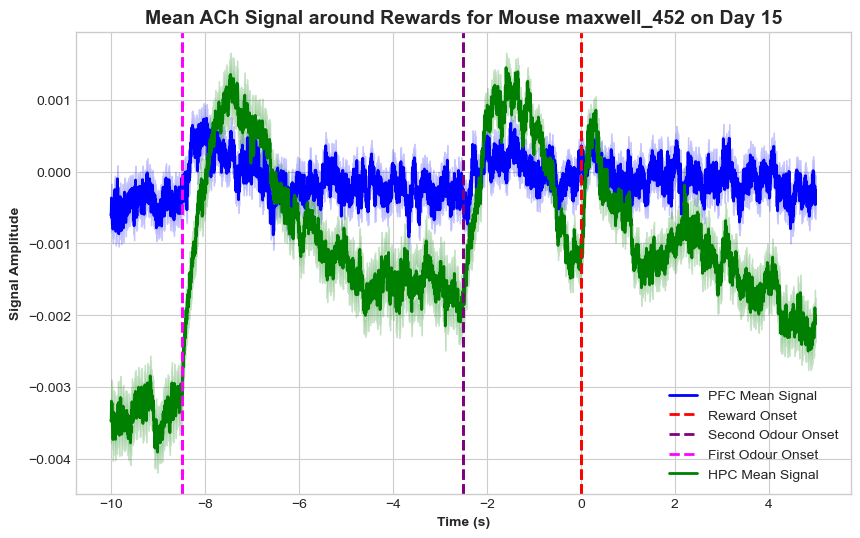

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_41538/2006393110.py:232: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


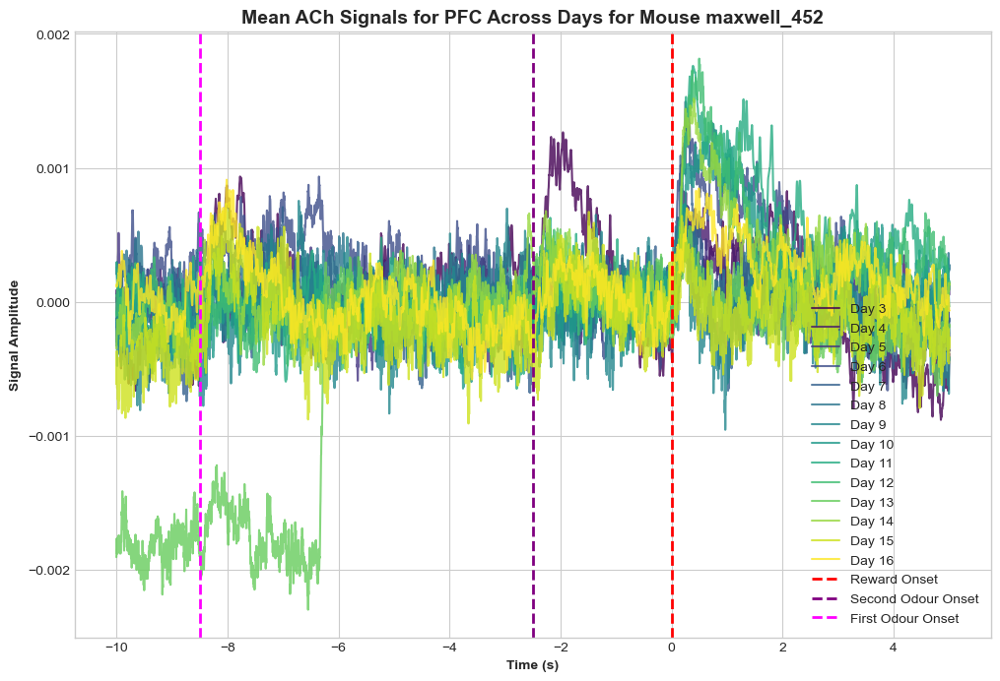

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_41538/2006393110.py:232: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', len(days_of_interest))


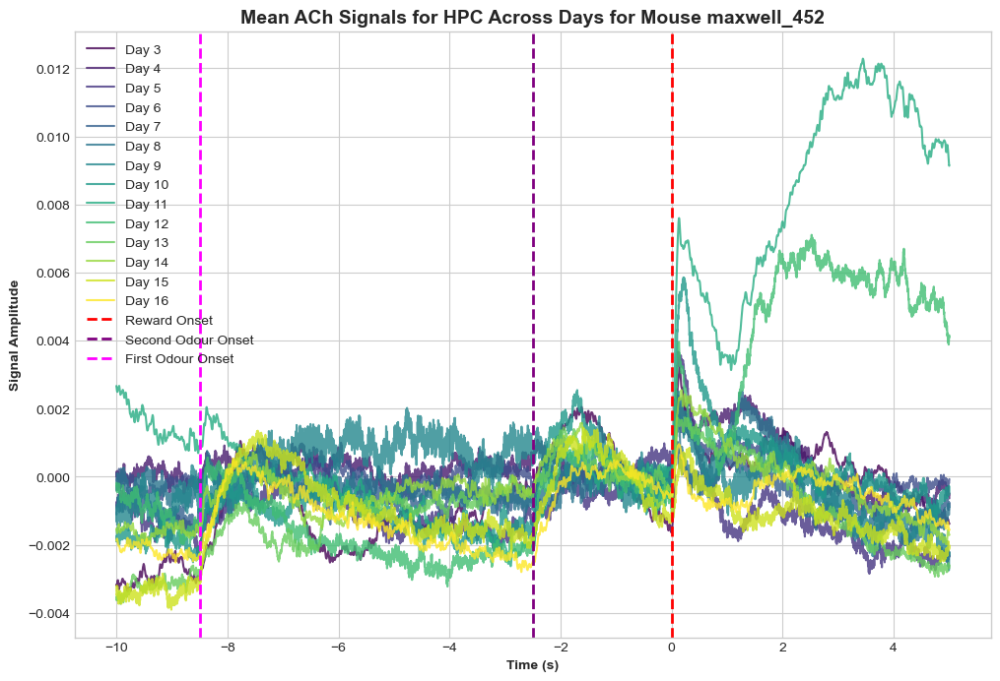

In [24]:
across_mice_analysis(mouse_ids, day, overlay)
mouse_ids = ['maxwell_452']  # Single mouse
days_of_interest = np.arange(3,17)
area_of_interest = 'PFC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

mouse_ids = ['maxwell_452']  # Single mouse
days_of_interest = np.arange(3,17)
area_of_interest = 'HPC'
plot_average_signals_across_days(mouse_ids, days_of_interest, area_of_interest)

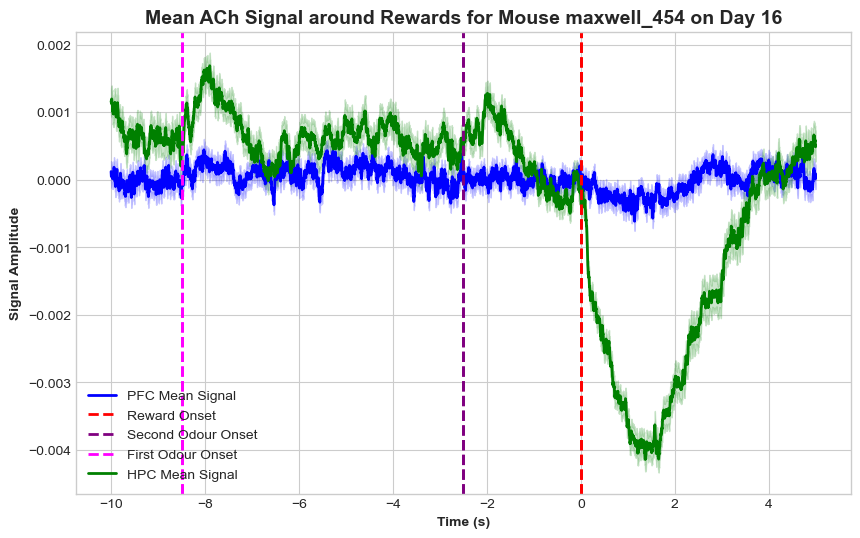

In [28]:
mouse_ids = ['maxwell_454']
day_of_interest = 16
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

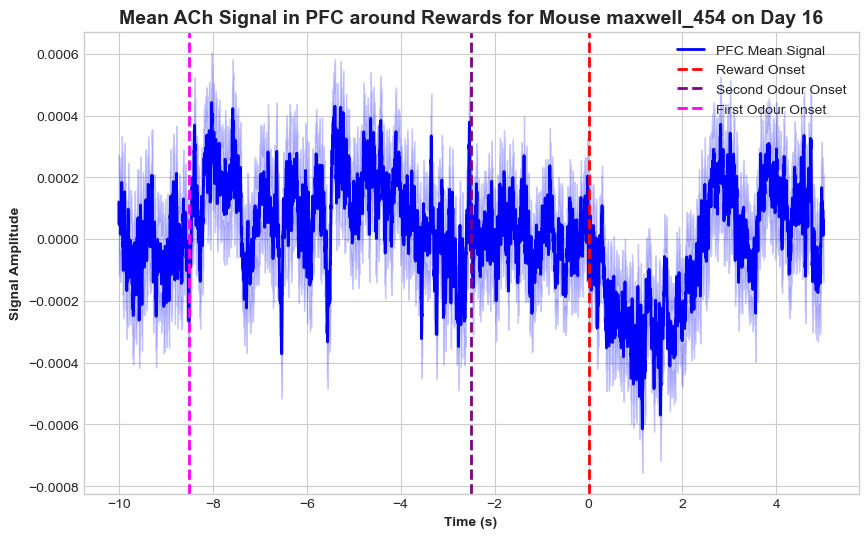

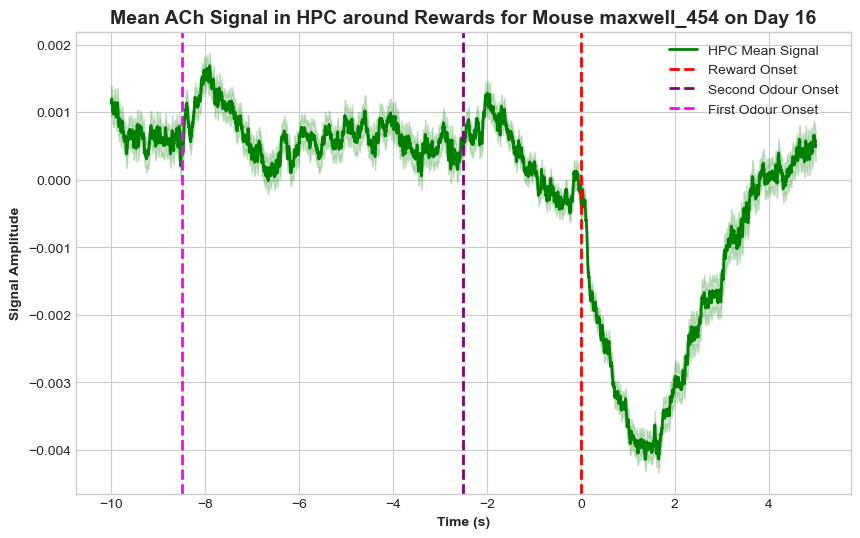

In [30]:
mouse_ids = ['maxwell_454']
day_of_interest = 16
across_mice_analysis(mouse_ids, day_of_interest,overlay=False)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_41538/2865705554.py:142: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


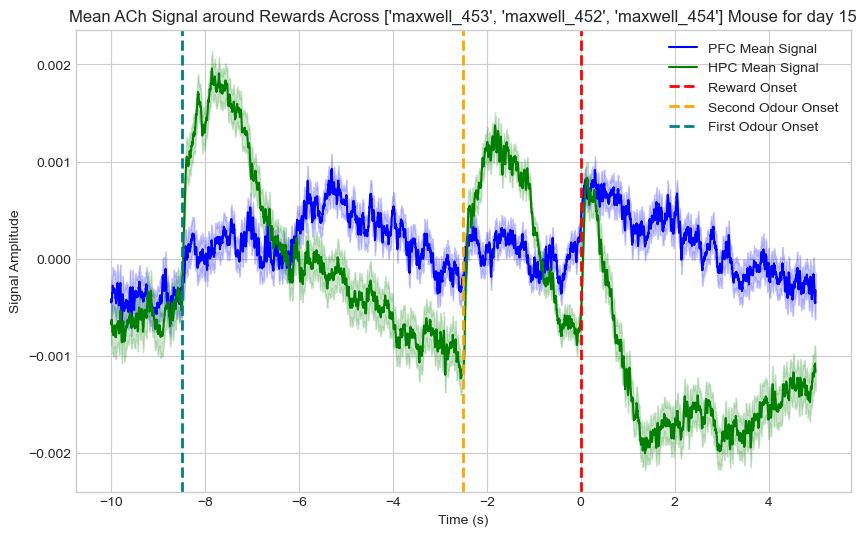

In [10]:
mouse_ids = ['maxwell_453','maxwell_452','maxwell_454']
day_of_interest = 15
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/2865705554.py:142: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


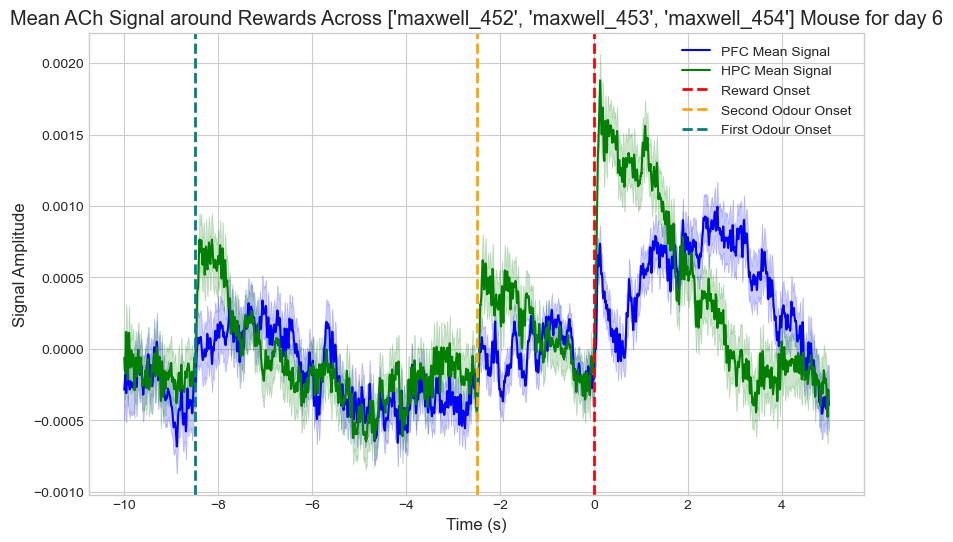

In [61]:
mouse_ids = ['maxwell_452', 'maxwell_453', 'maxwell_454']
day_of_interest = 6
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/170562367.py:142: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


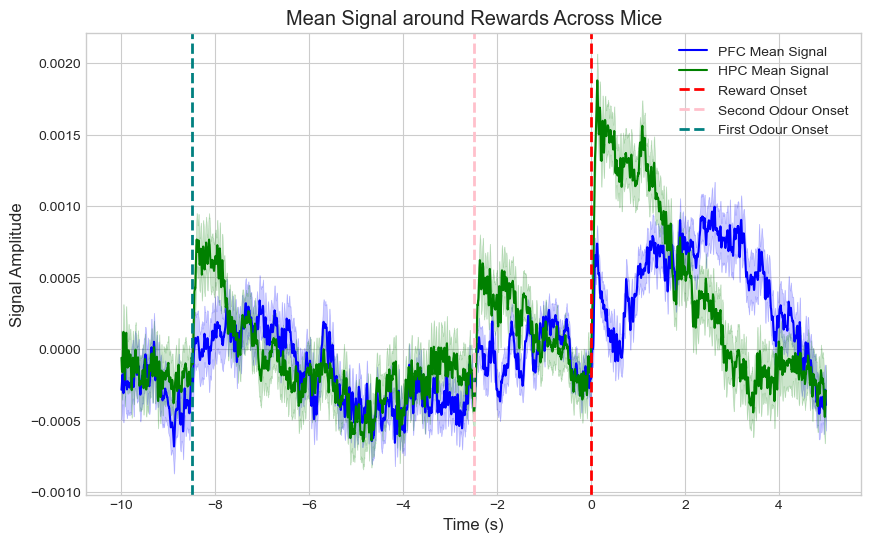

In [37]:
mouse_ids = ['maxwell_452', 'maxwell_453', 'maxwell_454']
day_of_interest = 6
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/1970419562.py:138: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/1970419562.py:161: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


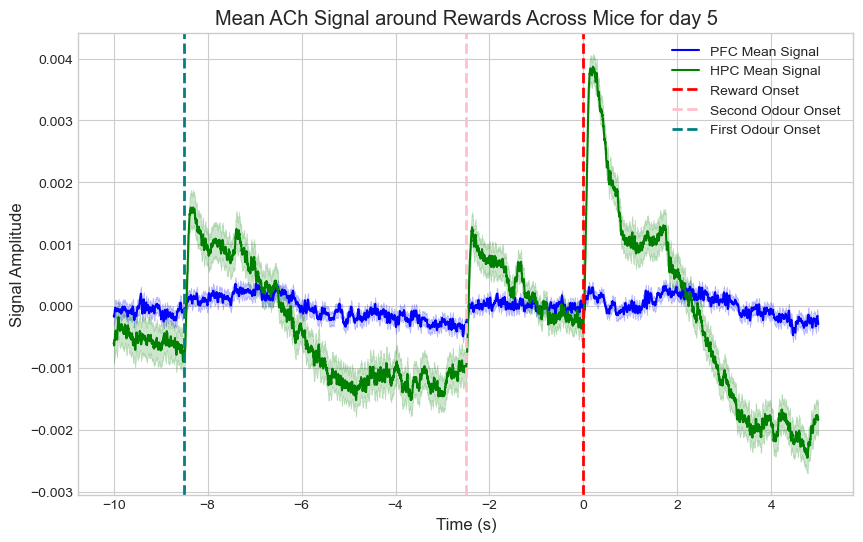

In [20]:
mouse_ids = ['maxwell_452', 'maxwell_453', 'maxwell_454']
day_of_interest = 5
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/1970419562.py:138: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/1970419562.py:161: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


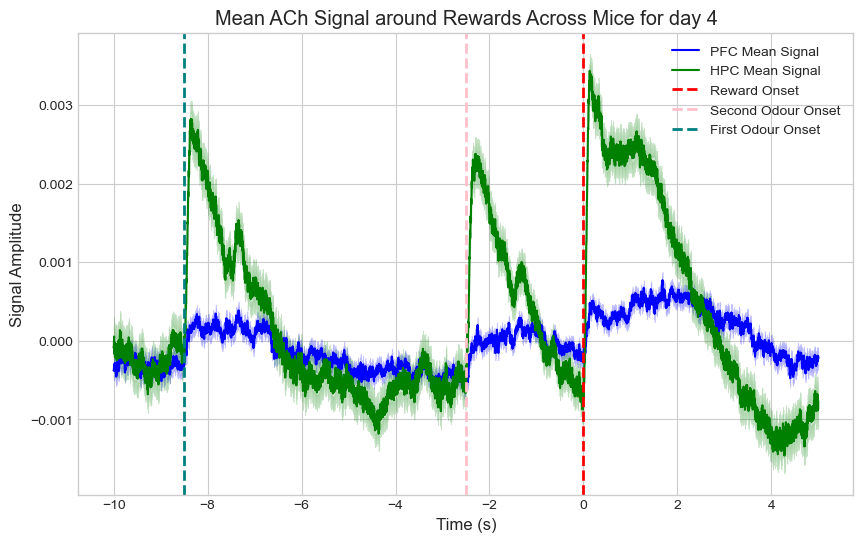

In [21]:
mouse_ids = ['maxwell_452', 'maxwell_453', 'maxwell_454']
day_of_interest = 4
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/1970419562.py:138: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
/var/folders/xc/fqjpc3c109d8130c9p4w179nnjty6s/T/ipykernel_97455/1970419562.py:161: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark-palette')


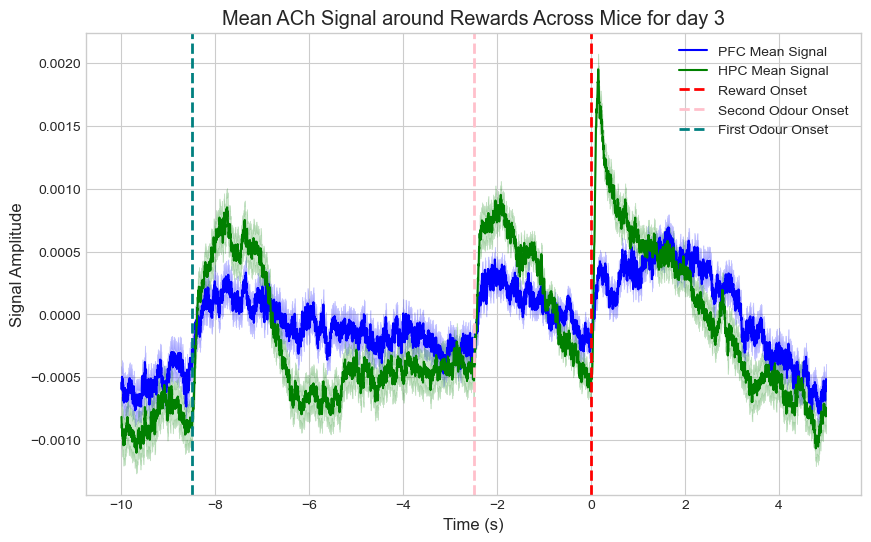

In [22]:
mouse_ids = ['maxwell_452', 'maxwell_453', 'maxwell_454']
day_of_interest = 3
across_mice_analysis(mouse_ids, day_of_interest,overlay=True)

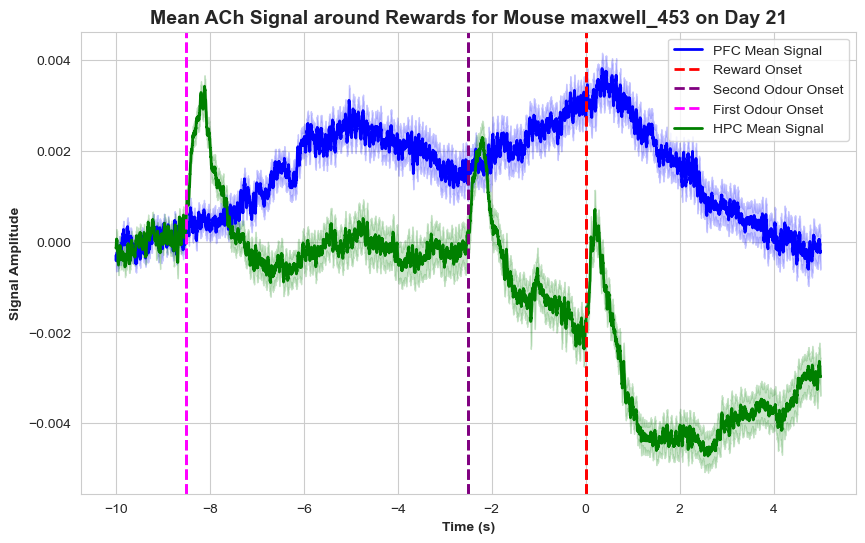

In [51]:
mouse_ids = ['maxwell_453']
overlay = True
days_of_interest = [21]

for day in days_of_interest:
    across_mice_analysis(mouse_ids, day, overlay,reward_trials=True)

